In [1]:
from IPython.display import Image, display
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import cv2
import numpy as np

In [2]:
#Read RGB iamge into an array
img = cv2.imread('band321.jpg')
img_shape = img.shape[:2]
print('image size = ',img_shape)

#specify no. of bands in the image
n_bands = 7

# 3 dimensional dummy array with zeros
MB_img = np.zeros((img_shape[0], img_shape[1], n_bands))

# stacking up images into the array
for i in range(n_bands):
    MB_img[:,:,i] = cv2.imread('band'+str(i+1)+'.jpg', cv2.IMREAD_GRAYSCALE)


image size =  (850, 1100)




Displaying color image of the scene


(-0.5, 1099.5, 849.5, -0.5)

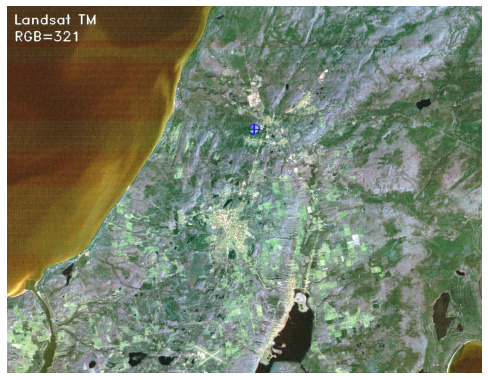

In [3]:
print('\n\nDisplaying color image of the scene')
plt.figure(figsize=(img_shape[0]/100, img_shape[1]/100))
plt.imshow(img, vmin=0, vmax=255)
plt.axis('off')

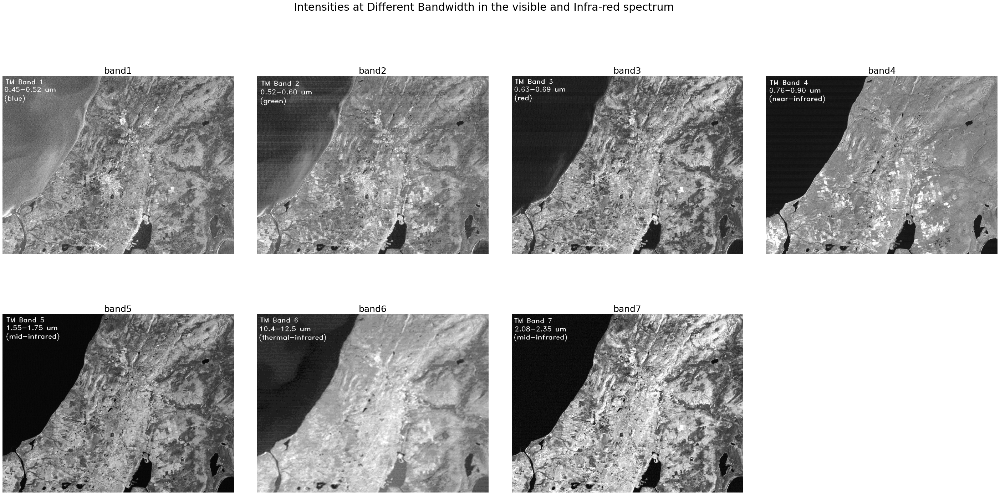

In [4]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as grid

fig, axes = plt.subplots(2,4,figsize=(50,23), sharex='all', sharey='all')
fig.subplots_adjust(wspace=0.1, hspace=0.15)
fig.suptitle('Intensities at Different Bandwidth in the visible and Infra-red spectrum', fontsize=30)
axes= axes.ravel()

for i in range(n_bands):
    axes[i].imshow(MB_img[:,:,i], cmap='gray', vmin=0, vmax=255)
    axes[i].set_title('band' + str(i+1), fontsize=25)
    axes[i].axis('off')
fig.delaxes(axes[-1])

In [5]:
# there exists redundancy of information between the bands which means reflectances are somewhat correlated across bands.

In [6]:
# Convert 2d band array in 1-d to make them as feature vectors and Standardization

MB_matrix = np.zeros((MB_img[:,:,0].size, n_bands))

for i in range(n_bands):
    MB_array = MB_img[:,:,i].flatten()  # convert 2d to 1d array
    MB_arrayStd = (MB_array - MB_array.mean())/MB_array.std()
    MB_matrix[:,i] = MB_arrayStd
MB_matrix.shape;

In [9]:
#5 Eigenvalues and Vectors Computation
#Covariance
np.set_printoptions(precision=3)
cov = np.cov(MB_matrix.transpose())

#Eigen Values
EigVal, EigVec = np.linalg.eig(cov)

print("Eigenvalues:\n\n", EigVal, "\n")
print("Eigenvectors:\n\n", EigVec, "\n")

Eigenvalues:

 [5.508 0.796 0.249 0.167 0.088 0.064 0.128] 

Eigenvectors:

 [[ 0.274  0.828 -0.124  0.468  0.06  -0.009  0.018]
 [ 0.379  0.219  0.713 -0.434  0.203  0.016 -0.266]
 [ 0.405  0.089 -0.227 -0.352 -0.797  0.131  0.015]
 [ 0.377 -0.341  0.448  0.509 -0.22  -0.184  0.447]
 [ 0.406 -0.135 -0.233 -0.117  0.423  0.644  0.395]
 [ 0.382 -0.343 -0.174  0.361  0.051  0.115 -0.748]
 [ 0.406 -0.078 -0.374 -0.255  0.3   -0.722  0.116]] 



In [10]:
#axis along eigenvector with the largest eigenvalue is the most significant PC axis and so on

In [11]:
order = EigVal.argsort()[::-1]
EigVal = EigVal[order]
EigVec = EigVec[:,order]

#Projecting data on Eigen vector directions resulting to Principal Components
PC = np.matmul(MB_matrix, EigVec)

Text(0.5, 0.98, 'Pair plot of PCs')

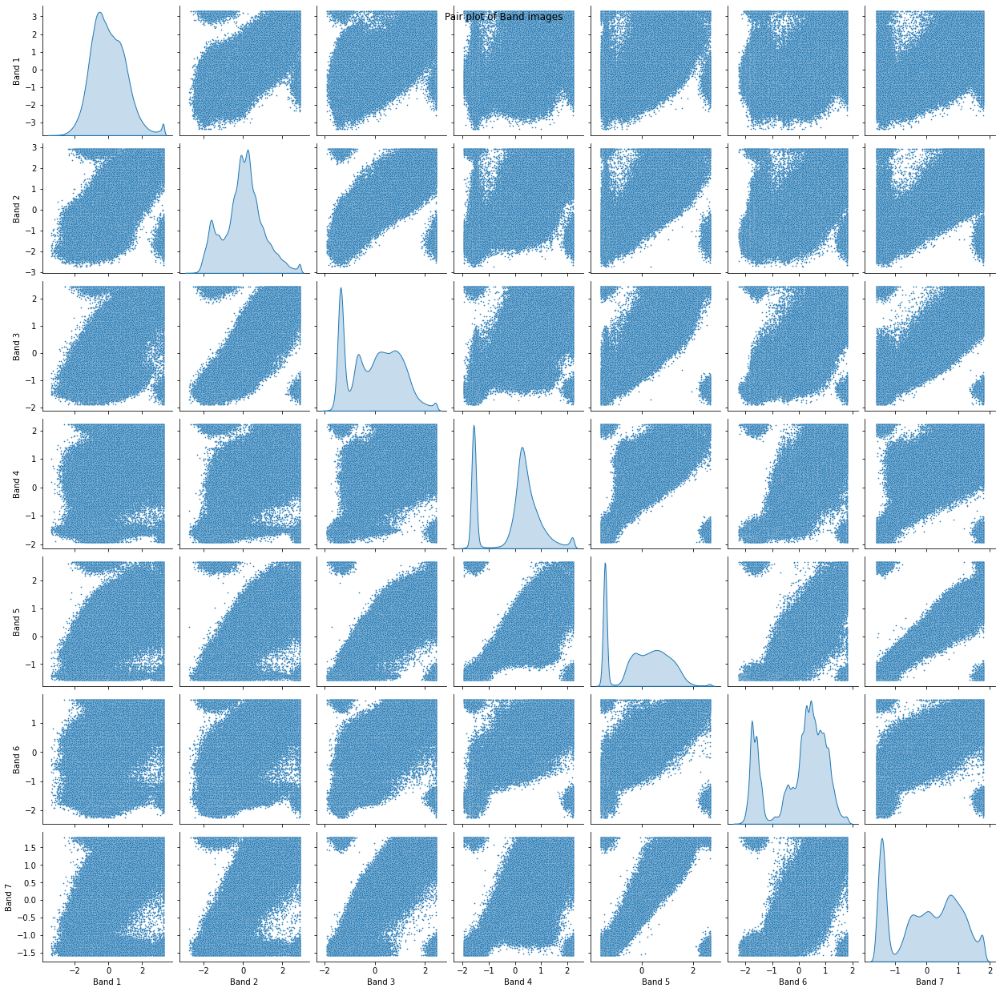

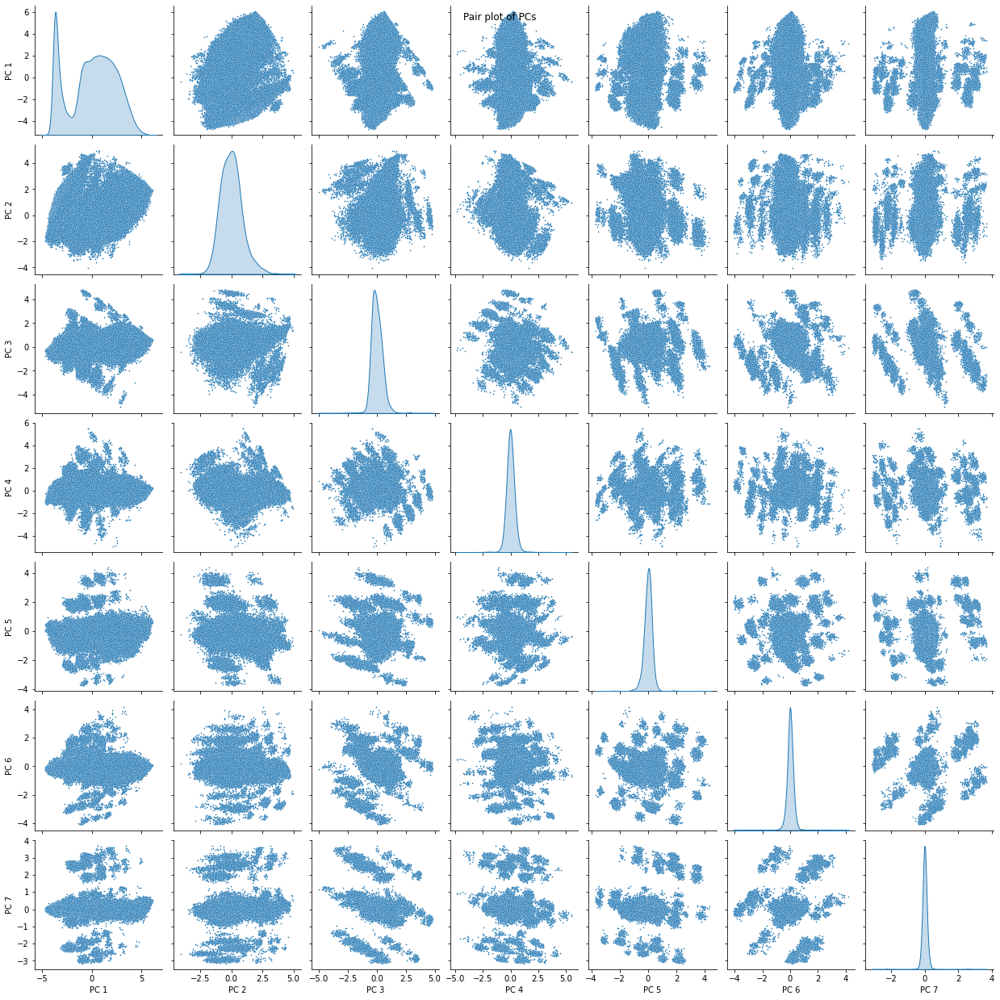

In [14]:
# Generate Pairplot for original data and transformed PCs

Bandnames = ['Band 1', 'Band 2', 'Band 3', 'Band 4', 'Band 5', 'Band 6', 'Band 7']
a = sns.pairplot(pd.DataFrame(MB_matrix,
                             columns = Bandnames),
                diag_kind = 'kde', plot_kws = {"s":3})
a.fig.suptitle("Pair plot of Band images")

PCnames = ['PC 1', 'PC 2', 'PC 3', 'PC 4', 'PC 5', 'PC 6', 'PC 7']
b = sns.pairplot(pd.DataFrame(PC,
                             columns = PCnames),
                            diag_kind = 'kde', plot_kws={"s":3})
b.fig.suptitle("Pair plot of PCs")

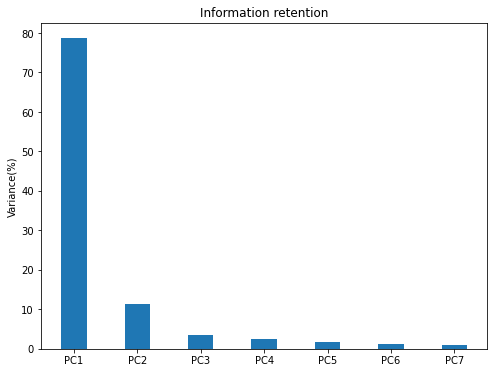

In [15]:
 # Compressibility Check
# Information Retained by Principal Components

plt.figure(figsize=(8,6))
plt.bar([1,2,3,4,5,6,7], EigVal/sum(Eigval)*100,align='center',width=0.4, tick_label = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7'])
plt.ylabel('Variance(%)')
plt.title('Information retention');

In [16]:
#7 Converting PCs back to Images


In [17]:
PC_2d = np.zeros((img_shape[0], img_shape[1], n_bands))
for i in range(n_bands):
    PC_2d[:,:,i] = PC[:,i].reshape(-1, img_shape[1])
    
# normalizing between 0 to 255
PC_2d_Norm = np.zeros((img_shape[0], img_shape[1], n_bands))
for i in range(n_bands):
    PC_2d_Norm[:,:,i] = cv2.normalize(PC_2d[:,:,i],
                                     np.zeros(img_shape),0,255, cv2.NORM_MINMAX)

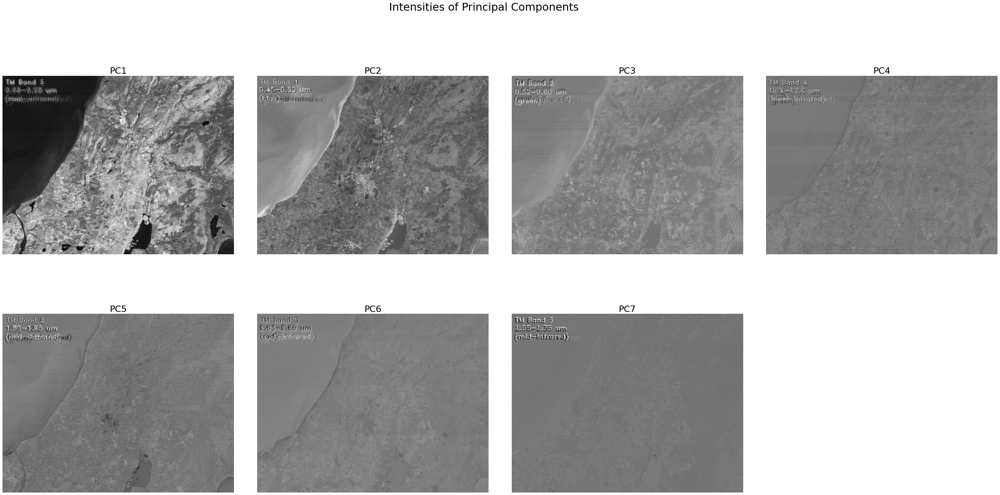

In [18]:
fig, axes = plt.subplots(2,4,figsize=(50,23), sharex='all',
                        sharey = 'all')
fig.subplots_adjust(wspace=0.1, hspace=0.15)
fig.suptitle('Intensities of Principal Components', fontsize=30)

axes = axes.ravel()
for i in range(n_bands):
    axes[i].imshow(PC_2d_Norm[:,:,i], cmap='gray', vmin=0, vmax=255)
    axes[i].set_title('PC'+str(i+1), fontsize=25)
    axes[i].axis('off')
fig.delaxes(axes[-1])

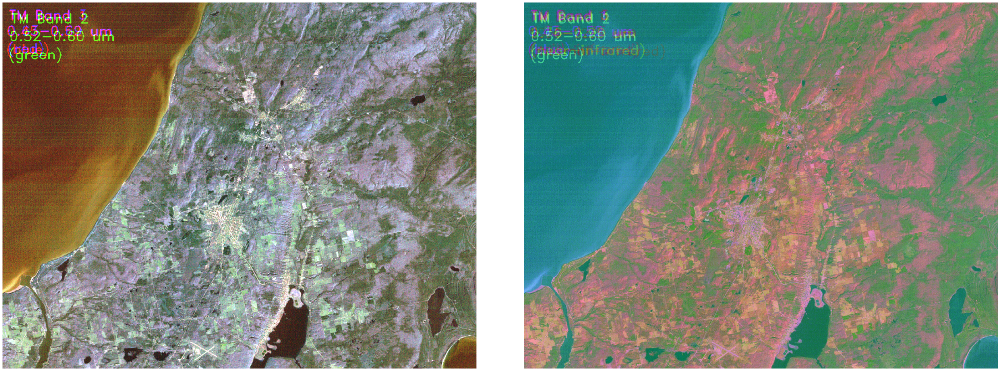

In [20]:
# Comparison of RGB and Image produced using first three bands

fig, axes = plt.subplots(1,2,figsize=(50,23),
                        sharex='all', sharey='all')
fig.subplots_adjust(wspace=0.1, hspace=0.15)

axes[0].imshow(MB_img[:,:,0:3].astype(int))
axes[0].axis('off');

axes[1].imshow(PC_2d_Norm[:,:,:3][:,:,[0,2,1]].astype(int))
axes[1].axis('off');